In [1]:
!pip install shap

Looking in indexes: https://mirrors.aliyun.com/pypi/simple/
     ---------------------------------------- 0.0/456.1 kB ? eta -:--:--
      --------------------------------------- 10.2/456.1 kB ? eta -:--:--
      --------------------------------------- 10.2/456.1 kB ? eta -:--:--
      --------------------------------------- 10.2/456.1 kB ? eta -:--:--
     --- --------------------------------- 41.0/456.1 kB 178.6 kB/s eta 0:00:03
     --- --------------------------------- 41.0/456.1 kB 178.6 kB/s eta 0:00:03
     --- --------------------------------- 41.0/456.1 kB 178.6 kB/s eta 0:00:03
     --- --------------------------------- 41.0/456.1 kB 178.6 kB/s eta 0:00:03
     ----------- ------------------------ 143.4/456.1 kB 387.0 kB/s eta 0:00:01
     ----------- ------------------------ 143.4/456.1 kB 387.0 kB/s eta 0:00:01
     ----------- ------------------------ 143.4/456.1 kB 387.0 kB/s eta 0:00:01
     -------------------------- --------- 337.9/456.1 kB 635.0 kB/s eta 0:00:01
     

In [3]:
print(model)


ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=7

In [ ]:
print(dataset.column_names)


['image', 'image_id', 'lesion_id', 'dx', 'dx_type', 'age', 'sex', 'localization', 'pixel_values']


In [6]:
print(model.config.id2label)  

{0: 'benign_keratosis-like_lesions', 1: 'basal_cell_carcinoma', 2: 'actinic_keratoses', 3: 'vascular_lesions', 4: 'melanocytic_Nevi', 5: 'melanoma', 6: 'dermatofibroma'}


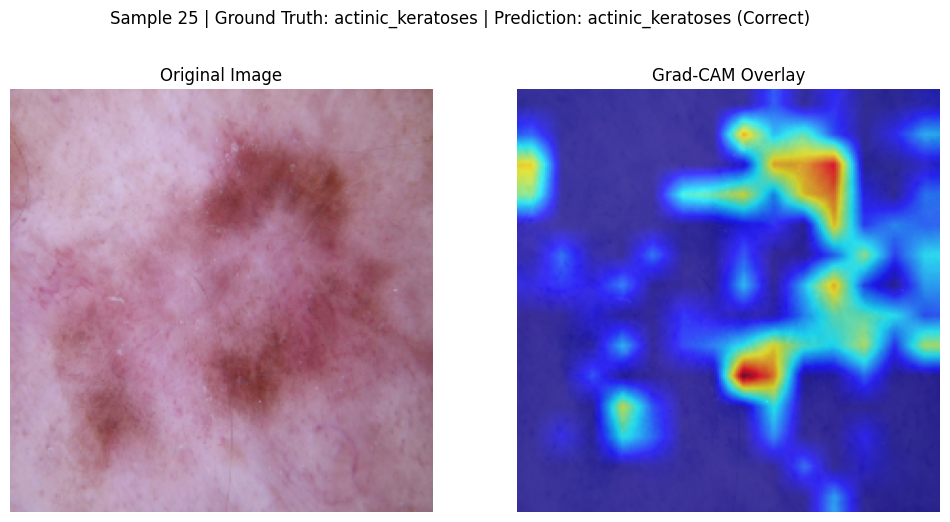

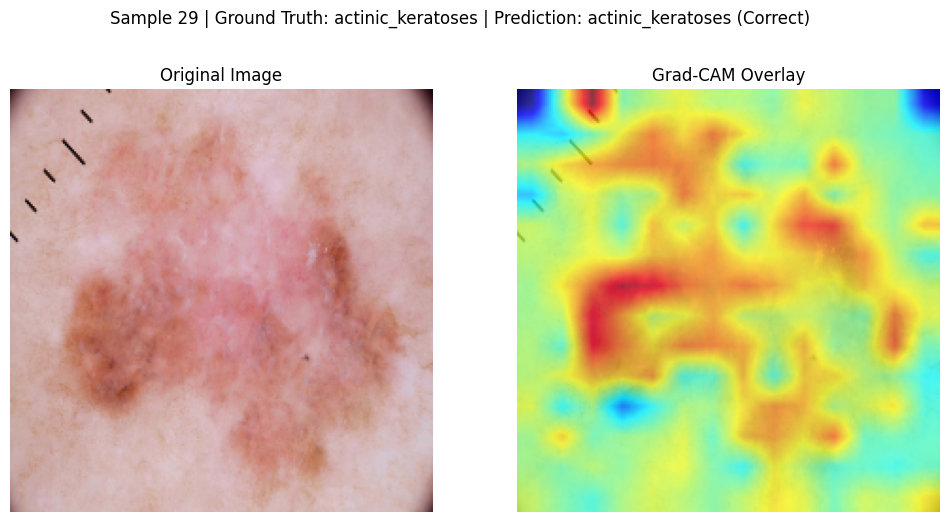

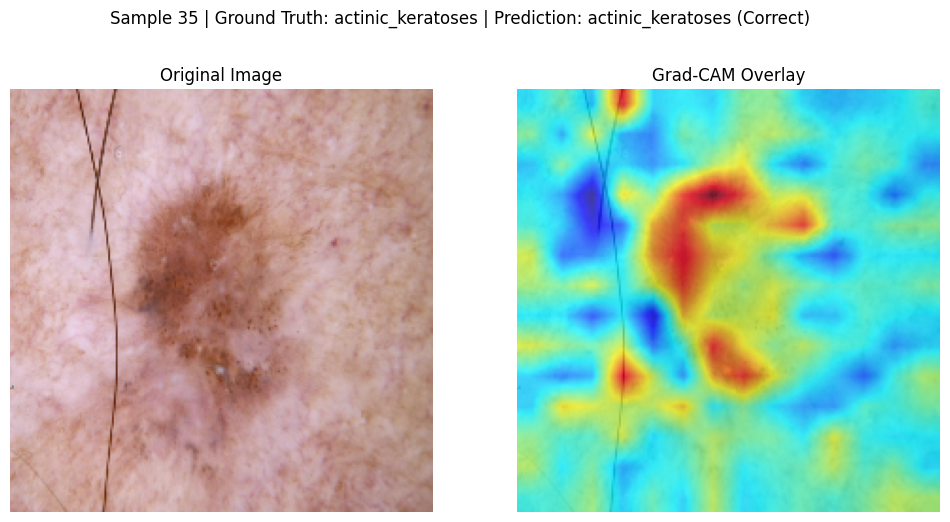

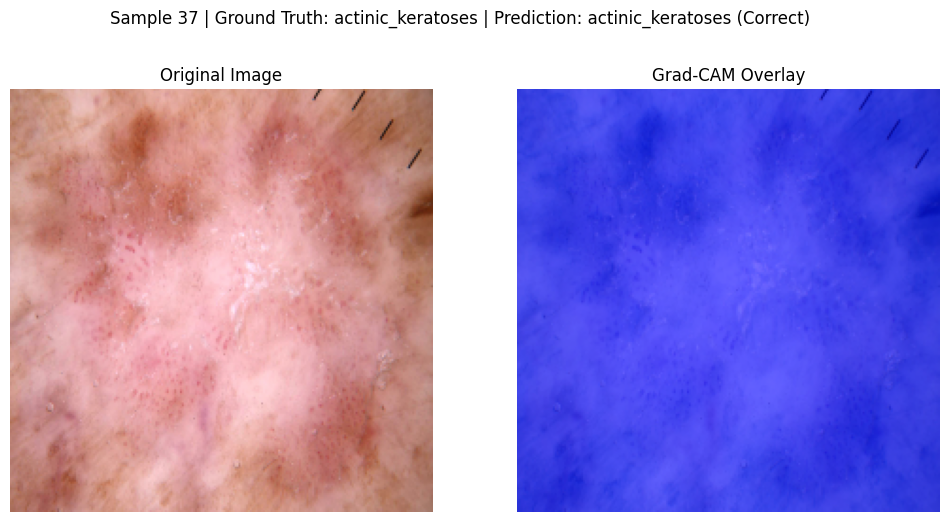

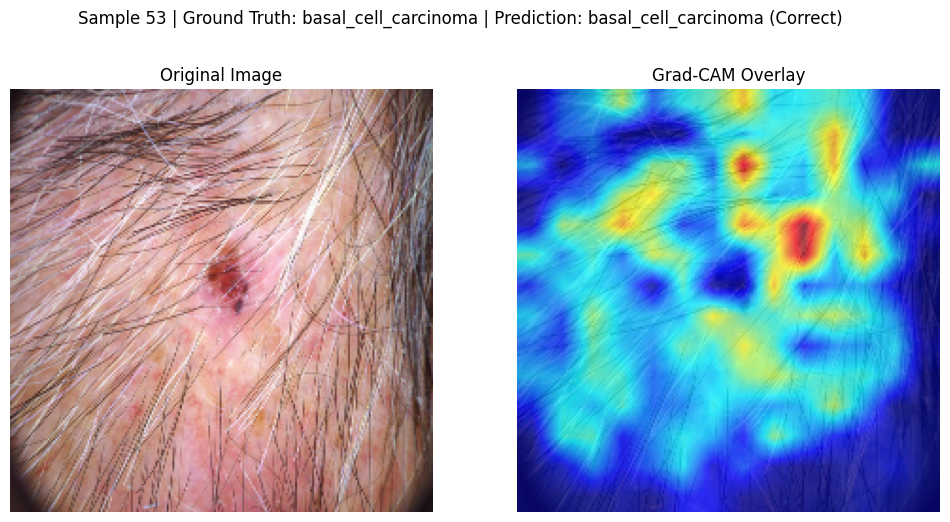

...

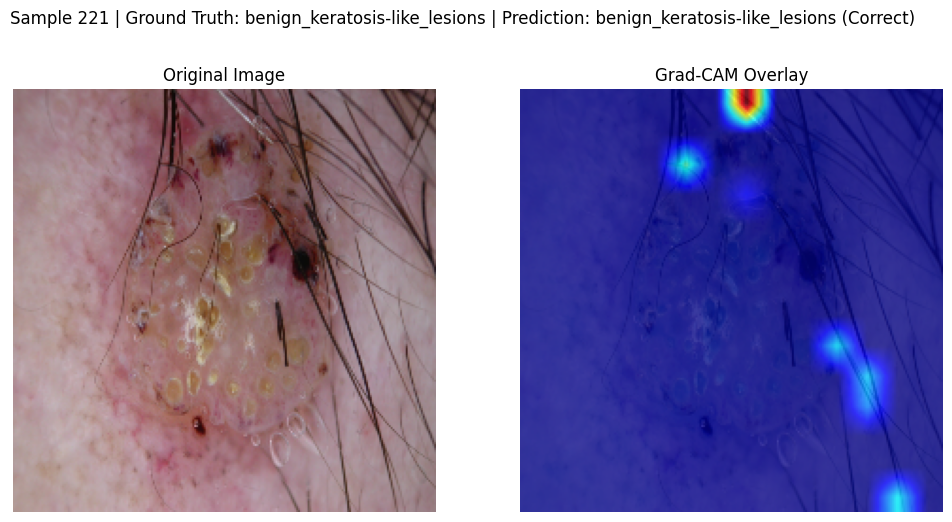

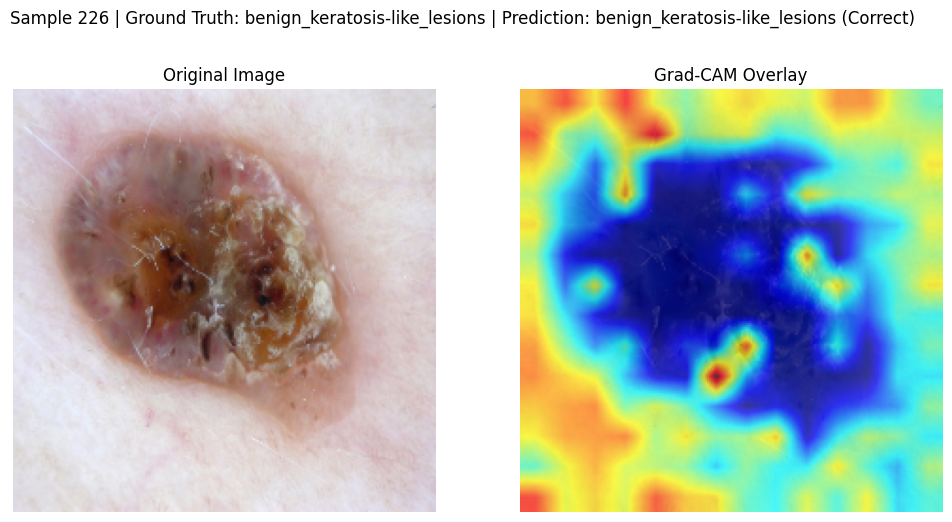

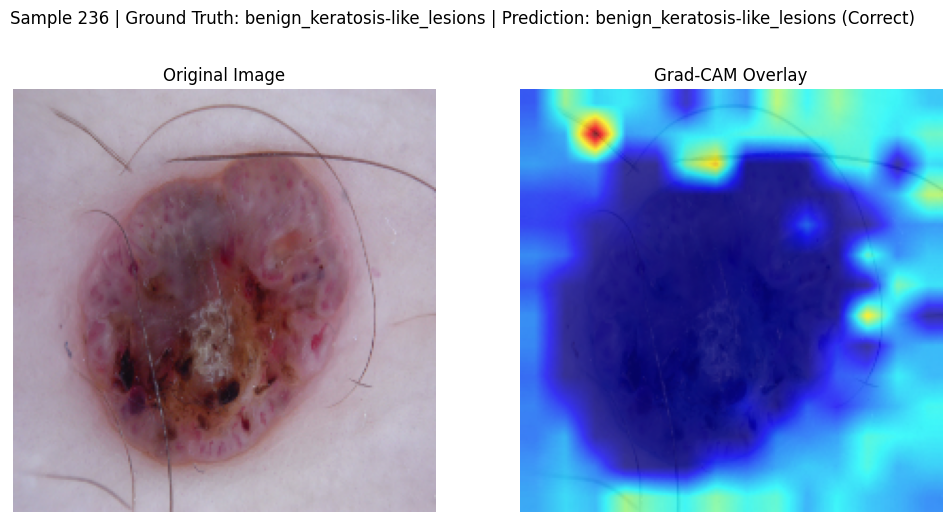

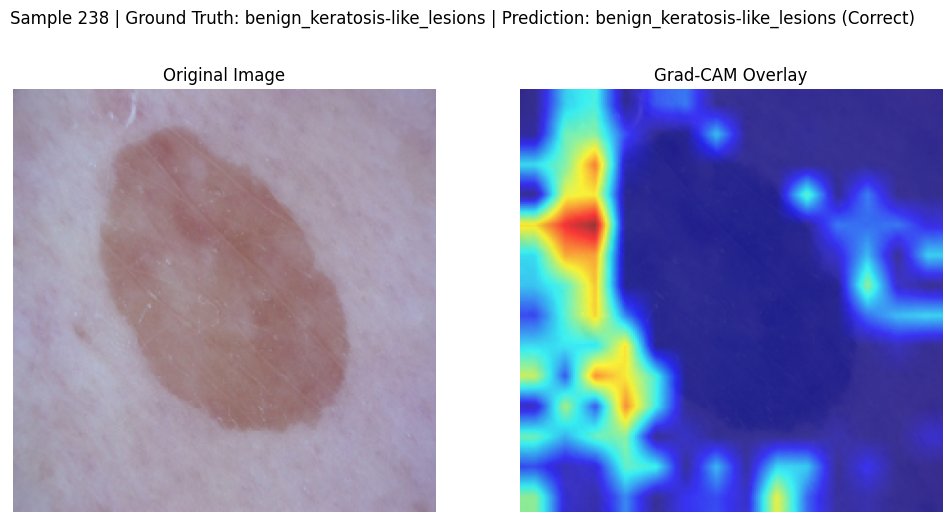

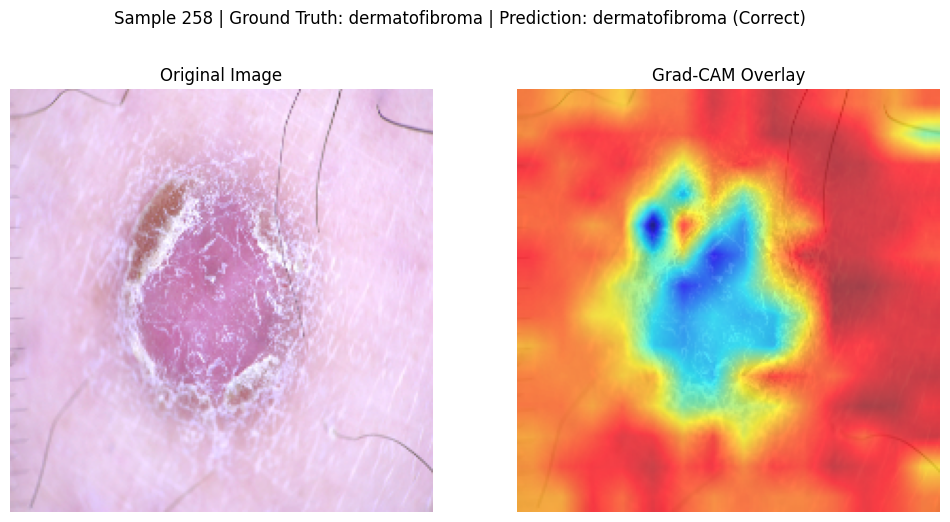

In [ ]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from transformers import ViTForImageClassification, ViTFeatureExtractor
from datasets import load_dataset

# Define class mapping dictionary (order as used during training)
label_mapping = {
    0: 'benign_keratosis-like_lesions',
    1: 'basal_cell_carcinoma',
    2: 'actinic_keratoses',
    3: 'vascular_lesions',
    4: 'melanocytic_Nevi',
    5: 'melanoma',
    6: 'dermatofibroma'
}

# -------------------------
# Modified Grad-CAM class (for 4D convolution outputs)
# -------------------------
class GradCam:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None  # Store forward activations
        self.gradients = None    # Store backward gradients

        # Register hooks to capture target layer's activations and gradients
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        # For convolution layers, output shape is [B, C, H, W]
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        # grad_output[0] shape is [B, C, H, W]
        self.gradients = grad_output[0]

    def __call__(self, inputs):
        self.model.zero_grad()
        output = self.model(inputs)
        # Select the class with the highest logit
        index = output.argmax()
        target = output[0, index]
        target.backward()

        # Get gradients and activations from target layer
        gradients = self.gradients   # shape: [B, C, H, W]
        activations = self.activations   # shape: [B, C, H, W]

        # Global average pool over spatial dimensions to get channel weights
        weights = gradients.mean(dim=(2, 3), keepdim=True)  # shape: [B, C, 1, 1]
        # Compute weighted sum over channels to obtain CAM
        cam = (activations * weights).sum(dim=1)  # shape: [B, H, W]
        cam = torch.relu(cam)
        # Take CAM of the first image and normalize to [0,1]
        cam = cam[0].detach().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        # Resize CAM to match input image size (224x224)
        cam = cv2.resize(cam, (224, 224))
        return cam

# -------------------------
# Helper function to generate heatmap overlay
# -------------------------
def gen_cam(image, mask):
    # Retain positive values and amplify mask differences
    mask = np.maximum(mask, 0)
    mask = mask * 3.0
    # Normalize mask to [0,1]
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    # Apply JET colormap: low values as blue, high values as warm colors (yellow, red)
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255.0
    # Fuse heatmap with original image: 70% heatmap, 30% original image
    cam = 0.7 * heatmap + 0.3 * image
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)

# -------------------------
# Evaluation code
# -------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pretrained model and feature extractor
model_name = "Anwarkh1/Skin_Cancer-Image_Classification"
original_model = ViTForImageClassification.from_pretrained(model_name).to(device)
original_model.config.return_dict = False
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name)

# Model wrapper: return only logits to ensure gradients are preserved
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model
    def forward(self, inputs):
        outputs = self.model(inputs)
        return outputs[0] if isinstance(outputs, tuple) else outputs

wrapped_model = ModelWrapper(original_model).to(device)

# Load dataset (skin_cancer test set)
dataset = load_dataset("marmal88/skin_cancer", split="test")

# Modify target layer: use the projection (convolution) layer from patch embedding.
# This layer outputs shape [B, C, 14, 14] and preserves spatial structure.
target_layer = original_model.vit.embeddings.patch_embeddings.projection

# Initialize Grad-CAM
grad_cam = GradCam(wrapped_model, target_layer)
wrapped_model.eval()


indices_to_plot = [25, 29, 35, 37, 53, 87, 104, 108, 114, 117, 128, 133, 155, 157, 159, 160, 163, 164, 170, 178, 183, 192, 201, 203, 208, 210, 211, 221, 226, 236, 238, 258]

for idx in indices_to_plot:
    sample = dataset[idx]
    

    if hasattr(sample["image"], "convert"):
        original_img = np.array(sample["image"])
    else:
        original_img = sample["image"]
    

    resized_img = cv2.resize(original_img, (224, 224))
    norm_img = np.float32(resized_img) / 255.0
    
    # feature extractor 
    inputs = feature_extractor(images=resized_img, return_tensors="pt")
    inputs = inputs["pixel_values"].to(device)
    
    
    with torch.no_grad():
        outputs = wrapped_model(inputs)
    predicted_index = outputs.argmax(dim=1).item()
    predicted_label = label_mapping[predicted_index]
    gt_label = sample["dx"]  
    correctness = "Correct" if predicted_label == gt_label else "Wrong"
    

    mask = grad_cam(inputs)
    

    overlay = gen_cam(norm_img, mask)
    

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(norm_img)
    axs[0].set_title("Original Image")
    axs[0].axis("off")
    axs[1].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Grad-CAM Overlay")
    axs[1].axis("off")
    plt.suptitle(f"Sample {idx} | Ground Truth: {gt_label} | Prediction: {predicted_label} ({correctness})")
    plt.show()


In [3]:
def print_common_indices(arr1, arr2, arr3):
    """
    接受三个列表，计算它们之间的交集，并打印共同的索引。

    参数:
        arr1, arr2, arr3: 分别为 true positive 数组，例如 [0, 1, 222]
    """
    # 使用 set 求交集
    common_set = set(arr1) & set(arr2) & set(arr3)
    # 转换成有序列表方便阅读
    common_indices = sorted(list(common_set))
    print("Common indices =", common_indices)

tp1 = [0, 1, 2, 3, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 42, 43, 48, 49, 52, 53, 59, 60, 63, 67, 68, 71, 73, 79, 80, 82, 84, 87, 93, 95, 97, 98, 99, 104, 108, 111, 114, 115, 117, 121, 124, 126, 127, 128, 132, 133, 134, 136, 137, 142, 153, 155, 157, 159, 160, 163, 164, 165, 170, 171, 173, 178, 179, 182, 183, 184, 185, 190, 191, 192, 195, 199, 201, 202, 203, 208, 210, 211, 213, 214, 216, 217, 221, 226, 227, 230, 231, 236, 238, 239, 241, 249, 251, 255, 257, 258, 260, 262, 263, 265, 266, 267, 268, 269, 270, 271, 272, 273, 275, 276, 277, 278, 279, 280, 281, 282, 283, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 505, 506, 507, 508, 509, 510, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 530, 531, 532, 533, 534, 535, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 615, 616, 617, 618, 619, 621, 622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634, 635, 637, 638, 639, 640, 641, 642, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 831, 832, 834, 835, 836, 837, 838, 839, 840, 842, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 870, 872, 873, 874, 875, 876, 877, 878, 879, 880, 881, 883, 884, 885, 886, 887, 888, 889, 890, 891, 892, 893, 894, 895, 896, 897, 898, 899, 900, 901, 902, 903, 904, 906, 907, 908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 944, 945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 962, 963, 964, 965, 966, 967, 968, 969, 971, 972, 973, 974, 975, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1002, 1004, 1005, 1006, 1008, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1065, 1066, 1067, 1069, 1070, 1071, 1072, 1073, 1074, 1075, 1076, 1077, 1079, 1080, 1081, 1082, 1083, 1084, 1085, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 1128, 1129, 1130, 1131, 1133, 1135, 1136, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1146, 1147, 1148, 1149, 1151, 1152, 1154, 1155, 1157, 1158, 1159, 1160, 1161, 1162, 1163, 1165, 1166, 1167, 1168, 1169, 1170, 1171, 1172, 1173, 1174, 1175, 1176, 1177, 1179, 1180, 1182, 1183, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1204, 1205, 1206, 1207, 1208, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1229, 1230, 1231, 1232, 1234, 1235, 1236, 1237, 1240, 1241, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1276, 1278, 1279, 1280, 1281, 1282, 1283]
tp2 = [0, 4, 12, 14, 17, 18, 19, 21, 22, 25, 29, 30, 31, 35, 36, 37, 42, 43, 44, 46, 47, 48, 49, 52, 53, 54, 55, 57, 58, 59, 61, 62, 65, 66, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 83, 87, 90, 91, 92, 95, 96, 97, 98, 100, 101, 103, 104, 105, 106, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 275, 276, 278, 279, 280, 282, 283, 284, 285, 286, 287, 288, 289, 291, 292, 293, 295, 296, 297, 298, 299, 300, 302, 303, 304, 305, 306, 307, 308, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 335, 336, 337, 339, 340, 341, 342, 343, 344, 346, 347, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 418, 419, 420, 421, 422, 423, 424, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 473, 474, 475, 477, 478, 479, 480, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 499, 500, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 570, 571, 572, 573, 574, 575, 576, 577, 578, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 608, 609, 610, 611, 612, 613, 615, 617, 618, 619, 620, 621, 622, 623, 624, 625, 627, 628, 629, 630, 631, 632, 633, 634, 635, 636, 637, 638, 639, 642, 643, 644, 646, 647, 648, 649, 650, 652, 653, 655, 656, 658, 660, 661, 662, 663, 664, 665, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 733, 734, 736, 737, 738, 739, 740, 741, 742, 743, 744, 746, 747, 748, 749, 750, 751, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 764, 765, 767, 768, 769, 770, 771, 772, 773, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 791, 792, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 809, 810, 811, 812, 814, 815, 817, 818, 819, 820, 821, 822, 823, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 856, 857, 859, 860, 862, 863, 864, 865, 866, 867, 868, 870, 871, 872, 873, 874, 875, 876, 877, 878, 879, 880, 881, 882, 884, 885, 886, 887, 888, 890, 891, 892, 894, 895, 896, 897, 898, 899, 901, 902, 903, 905, 906, 907, 908, 909, 910, 911, 913, 914, 915, 916, 917, 918, 919, 920, 922, 924, 925, 926, 927, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 944, 945, 946, 947, 948, 950, 952, 953, 954, 955, 956, 957, 958, 959, 961, 962, 963, 964, 966, 967, 968, 969, 971, 972, 973, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1004, 1005, 1006, 1007, 1008, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1025, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1036, 1037, 1038, 1039, 1041, 1042, 1043, 1044, 1045, 1046, 1048, 1049, 1050, 1051, 1052, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1061, 1064, 1065, 1067, 1069, 1070, 1071, 1072, 1073, 1074, 1075, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1084, 1085, 1087, 1088, 1089, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1118, 1119, 1120, 1121, 1123, 1126, 1128, 1129, 1130, 1133, 1134, 1136, 1139, 1141, 1143, 1146, 1150, 1151, 1152, 1153, 1155, 1157, 1158, 1161, 1162, 1163, 1164, 1165, 1167, 1172, 1176, 1177, 1178, 1179, 1181, 1182, 1184, 1185, 1186, 1190, 1192, 1195, 1198, 1199, 1200, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1213, 1217, 1219, 1221, 1222, 1223, 1224, 1225, 1227, 1228, 1229, 1231, 1232, 1233, 1234, 1235, 1237, 1238, 1239, 1241, 1242, 1244, 1245, 1246, 1247, 1248, 1249, 1253, 1255, 1256, 1257, 1259, 1260, 1261, 1262, 1263, 1264, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284]
tp3 = [4, 5, 13, 20, 23, 25, 28, 29, 33, 35, 37, 39, 44, 45, 53, 54, 55, 56, 57, 60, 64, 69, 74, 77, 82, 84, 87, 89, 96, 104, 106, 108, 114, 116, 117, 118, 119, 122, 123, 128, 131, 133, 135, 138, 139, 143, 147, 151, 154, 155, 157, 159, 160, 162, 163, 164, 167, 169, 170, 174, 175, 178, 180, 181, 183, 192, 193, 197, 201, 203, 205, 208, 210, 211, 212, 220, 221, 226, 233, 235, 236, 238, 256, 258, 260, 261, 265, 266, 267, 268, 269, 270, 271, 272, 273, 275, 276, 277, 278, 279, 280, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 608, 609, 610, 611, 612, 613, 615, 616, 617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634, 635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 870, 871, 872, 873, 874, 875, 876, 877, 878, 879, 880, 881, 882, 884, 885, 886, 887, 888, 889, 890, 891, 892, 894, 895, 896, 897, 898, 899, 901, 902, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1002, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1052, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064, 1065, 1066, 1067, 1068, 1069, 1070, 1071, 1072, 1073, 1074, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1128, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1137, 1138, 1139, 1140, 1141, 1143, 1144, 1145, 1146, 1147, 1149, 1150, 1151, 1152, 1153, 1154, 1155, 1156, 1157, 1158, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1167, 1169, 1171, 1172, 1173, 1174, 1175, 1176, 1177, 1178, 1179, 1181, 1182, 1184, 1185, 1186, 1187, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1198, 1199, 1200, 1201, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1271, 1272, 1273, 1274, 1279, 1280, 1281, 1283]

print_common_indices(tp1, tp2, tp3)


Common indices = [25, 29, 35, 37, 53, 87, 104, 108, 114, 117, 128, 133, 155, 157, 159, 160, 163, 164, 170, 178, 183, 192, 201, 203, 208, 210, 211, 221, 226, 236, 238, 258, 260, 265, 266, 267, 268, 269, 270, 271, 272, 273, 275, 276, 278, 279, 280, 282, 283, 285, 286, 287, 288, 289, 291, 292, 293, 295, 296, 297, 298, 299, 300, 302, 304, 305, 306, 307, 308, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 335, 336, 337, 339, 340, 341, 342, 343, 344, 346, 347, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 369, 370, 372, 373, 374, 375, 376, 377, 378, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 418, 419, 420, 421, 422, 423, 424, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 441, 442, 443, 445, 446, 447, 448, 449, 450, 451